## Spatial analysis

This script generate the figure 4f, figure 6b-d, supplementary figure 7 and supplementary figure 8.

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Import packages
import numpy as np
import scanpy as sc
import spacec as sp
import squidpy as sq
import anndata
import pandas as pd
from numpy.random import default_rng
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import os
from glob import glob
import seaborn as sns
import bbknn
# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

2026-09-10 11:06:54.387141: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2026-09-10 11:06:54.387163: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Running Scanpy 1.11.4, on 2026-09-10 11:07.


In [3]:
print("scanpy:", sc.__version__)
print("spacec:", sp.__version__)
print("squidpy", sq.__version__)

scanpy: 1.11.4
spacec: 0.1.2
squidpy 1.6.5


## Publication plot setting

In [4]:
plot_folder = "/media/synology/Huijuan/Plots/IPF_EC paper/TMAs/TMA/"  
sc.settings.figdir = plot_folder
# Global defaults for ALL Scanpy plots
sc.set_figure_params(vector_friendly=True, format='pdf', dpi=50)

plt.rcParams["figure.figsize"] = (5, 5)
plt.rcParams.update({'font.size': 14})
plt.rcParams['pdf.fonttype'] = 42
sns.set_style("ticks")

## Define relative frequency function

In [5]:
def calc_relFreq(a, group_by="cell_type", xlabel="days", condition="batch"):
    freqs = a.obs.groupby(["batch", group_by]).size()
    samples = np.unique(a.obs["batch"])
    ind = a.obs[group_by].cat.categories

    relFreqs = [freqs[ident] / sum(freqs[ident]) for ident in samples]
    relFreqs = pd.DataFrame(relFreqs, columns=ind, index=samples).fillna(0)

    cell_types = {}
    combis = a.obs.groupby(["batch", xlabel]).groups.keys()

    for c in combis:
        cell_types[c[0]] = c[1]
    relFreqs[xlabel] = [cell_types[l] for l in relFreqs.index]

    if condition:
        combis = a.obs.groupby(["batch", condition]).groups.keys()
        for c in combis:
            cell_types[c[0]] = c[1]
        relFreqs[condition] = [cell_types[l] for l in relFreqs.index]

    return relFreqs

In [6]:
def plot_cluster_composition(
    relFreqs,
    xlabel="name",
    figsize=(6, 10),
    width=0.8,
    order=None,
    errbar=None,
    labelsize=15,
    ticksize=13,
    capsize=None,
    margins=(0.02, 0.04),
    cols=None,
    save=None,
):
    """
    Given a relative frequency table, plot the values as a stacked barplot.
    """

    patches = []

    fig, ax = plt.subplots()
    fig.set_size_inches(figsize)

    order = np.unique(relFreqs[xlabel]) if order is None else order
    ci = 95 if errbar else None

    ax.margins(margins[0], margins[1])

    cell_types = np.flip(
        [col for col in relFreqs.columns if col not in ["identifier", xlabel]]
    )

    bars = pd.DataFrame(index=order, data=np.zeros(len(order)))
    plot_data = pd.DataFrame(relFreqs[xlabel])

    for i, typ in enumerate(cell_types):
        sum_up = [
            relFreqs[typ].values[i] + bars.loc[g].values[0]
            for i, g in enumerate(relFreqs[xlabel])
        ]

        plot_data[typ] = sum_up

        bars.iloc[:, 0] = (
            bars.iloc[:, 0]
            + relFreqs[[typ, xlabel]]
            .groupby(xlabel)
            .mean()
            .loc[order, typ]
        )

    for i, typ in enumerate(reversed(cell_types)):
        sns.barplot(
            data=plot_data,
            x=xlabel,
            y=typ,
            order=order,
            ci=ci,
            errcolor="black",
            color=cols[i] if cols is not None else None,
            capsize=capsize,
            ax=ax,
        )

        patches.append(
            mpatches.Patch(
                color=cols[i] if cols is not None else None,
                label=typ,
            )
        )

    ax.set_xlabel(xlabel, size=labelsize)
    ax.set_ylabel("relative frequency", size=labelsize)
    ax.tick_params(labelsize=ticksize)
    ax.set_xticklabels(order, rotation="vertical")

    # Change bar widths
    for bar in ax.patches:
        centre = bar.get_x() + bar.get_width() / 2.0
        bar.set_x(centre - width / 2.0)
        bar.set_width(width)

    plt.legend(
        handles=patches,
        loc="center left",
        bbox_to_anchor=(1.02, 0.5),
        prop={"size": ticksize},
        frameon=False,
    )

    fig.subplots_adjust(right=0.85)

    if save:
        fig.savefig(
            save,
            bbox_inches="tight",
            pad_inches=0.3,
            dpi=300,
        )
        print(f"Saving Figure to {save}")

    plt.show()
    plt.close()

## Load data object

In [7]:
object_folder = "/media/HDD_1/Huijuan/Spatial_4i_IPF_EC_paper/data_object/"
adata = sc.read(object_folder + "18082026_4i_annotation_final.h5ad")
adata

AnnData object with n_obs × n_vars = 350031 × 24
    obs: 'TMA', 'condition', 'x', 'y', 'region_num', 'fibrosis_extent', 'leiden_0.3', 'domain', 'severity', 'cell_type', 'Level_1', 'batch', 'fibrosis degree', 'ashcroft score'
    uns: 'Level_1_colors', 'TMA_colors', 'ashcroft score_colors', 'cell_type_colors', 'condition_colors', 'dendrogram_domain', 'dendrogram_leiden_0.3', 'domain_colors', 'fibrosis degree_colors', 'fibrosis_extent_colors', 'leiden_0.3', 'leiden_0.3_colors', 'neighbors', 'pca', 'severity_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

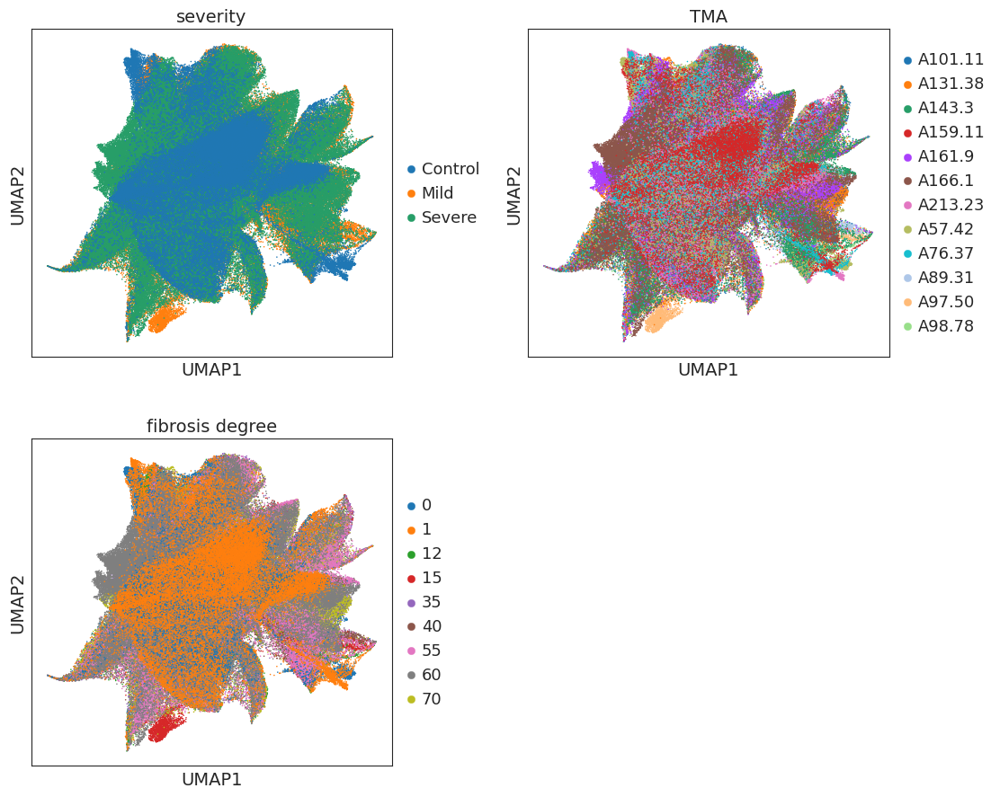

In [8]:
sc.pl.umap(adata, color = ["severity", "TMA", "fibrosis degree"], ncols=2, wspace=0.25, size=5,
          frameon=True)

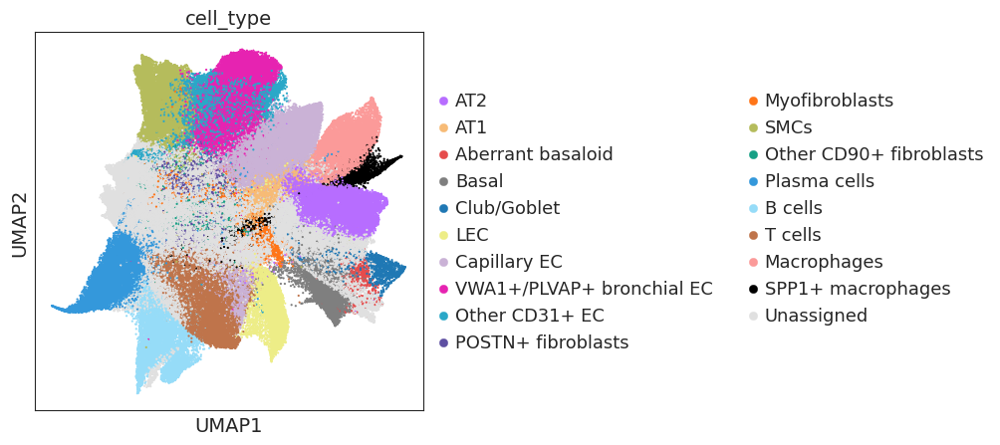

In [9]:
sc.pl.umap(adata, color = ["cell_type"], wspace = 0.2, size= 10,)
           #save="_spatial_TMA_celltype_unknown.pdf" )

## Spatial profiling

A159.11


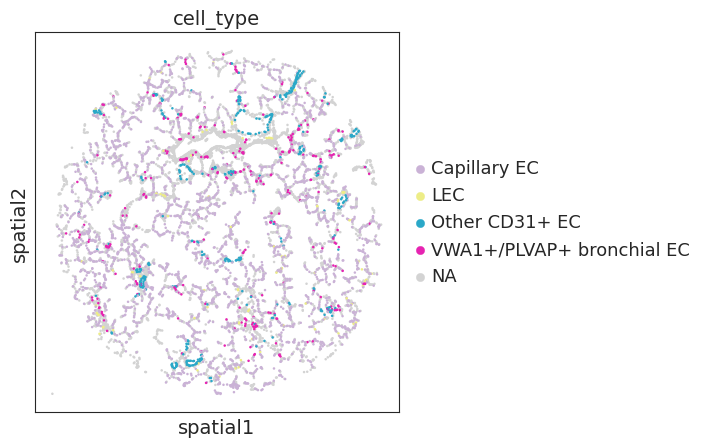

A213.23


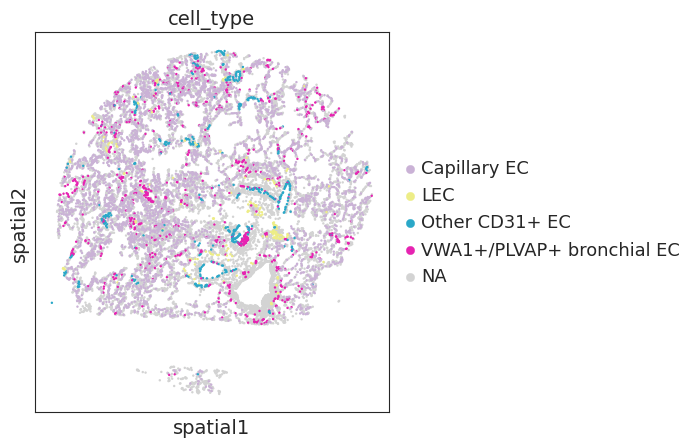

A57.42


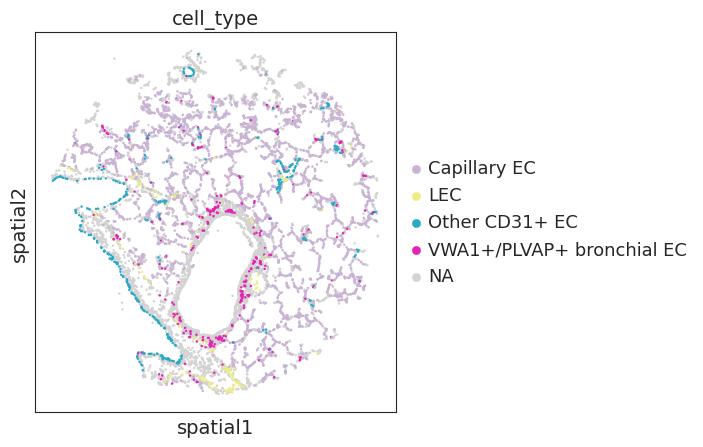

A76.37


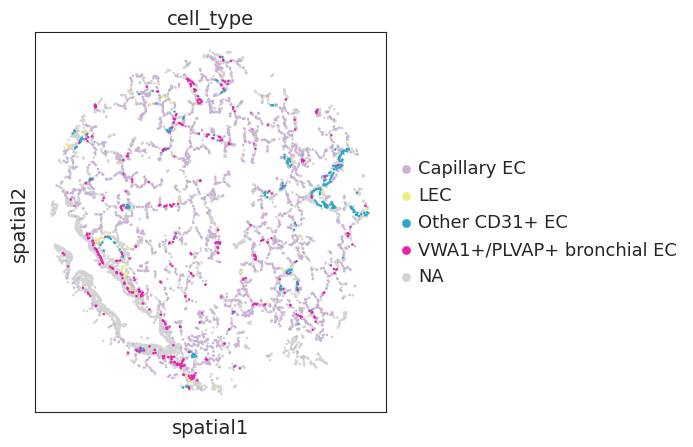

A89.31


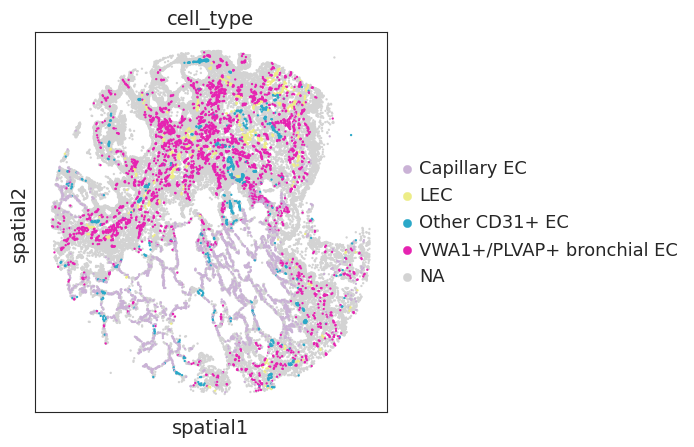

A97.50


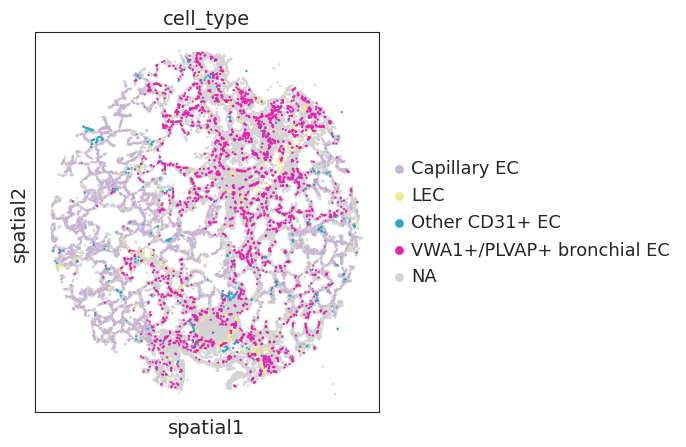

A98.78


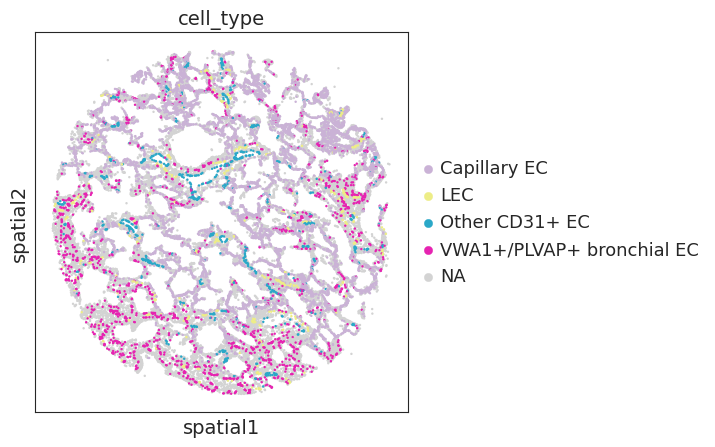

A101.11


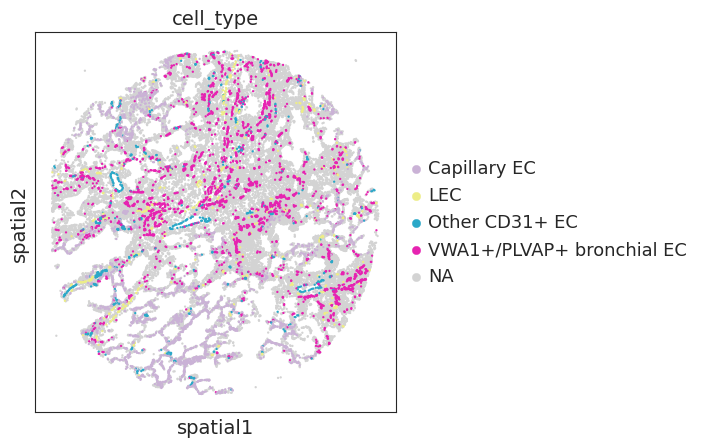

A131.38


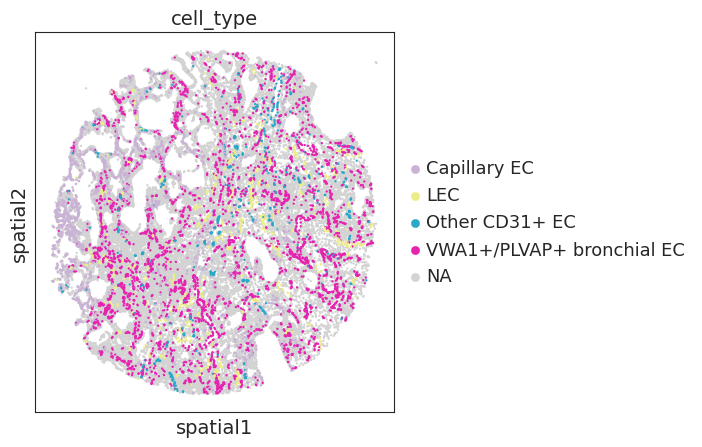

A143.3


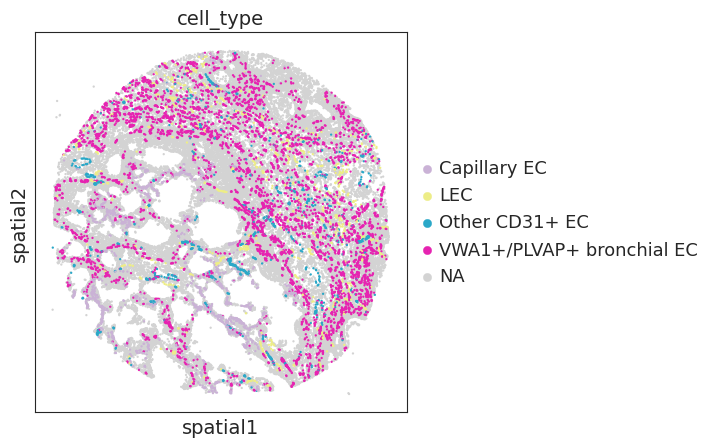

A161.9


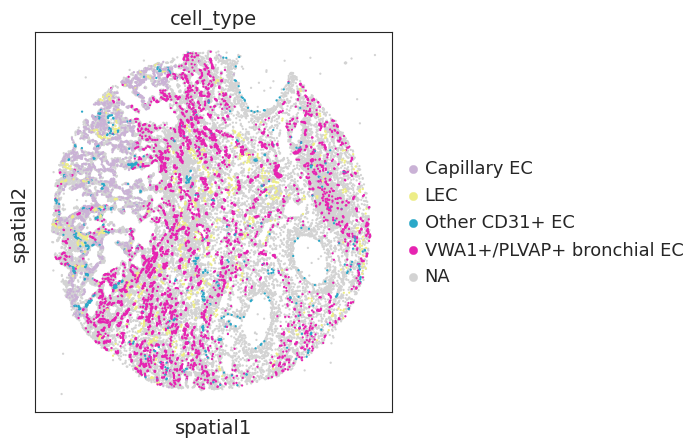

A166.1


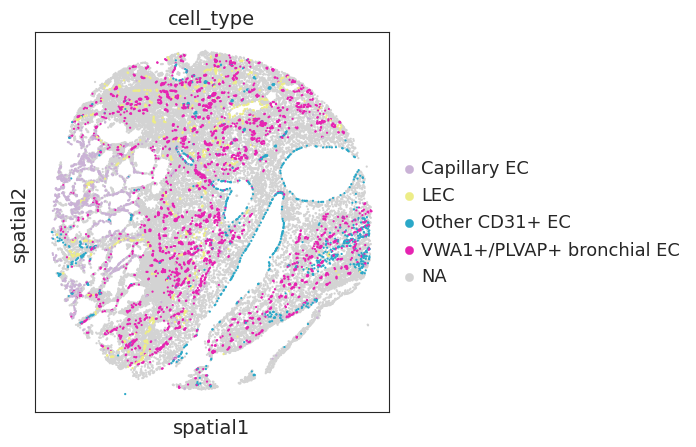

In [10]:
TMAs = ["A159.11", "A213.23", "A57.42", "A76.37", #control
        "A89.31", "A97.50", "A98.78", "A101.11", #mild
        "A131.38", "A143.3", "A161.9", "A166.1", # severe
]
for TMA in TMAs:
    print(TMA)
    #sc.set_figure_params(figsize=(10, 10))
    sc.pl.spatial(adata[adata.obs.TMA == TMA], color="cell_type", spot_size=30, 
                  groups = ["VWA1+/PLVAP+ bronchial EC", "Capillary EC", "LEC", "Other CD31+ EC"], scale_factor=2.91, cmap = "magma_r")

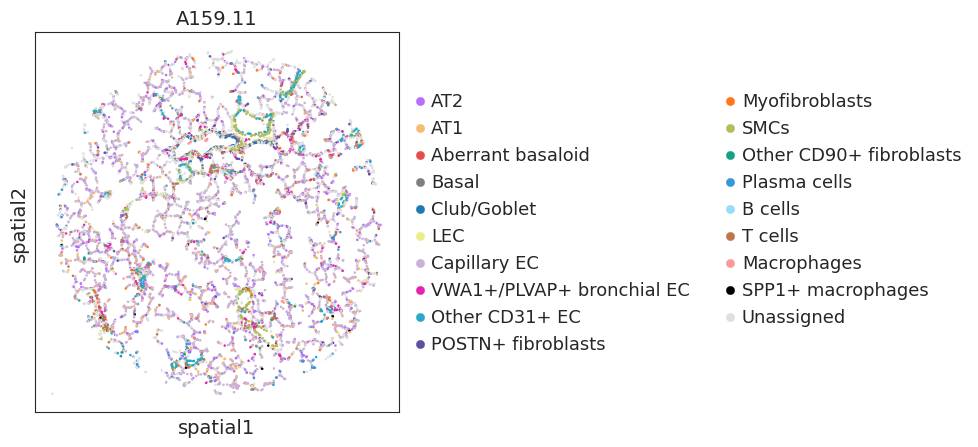

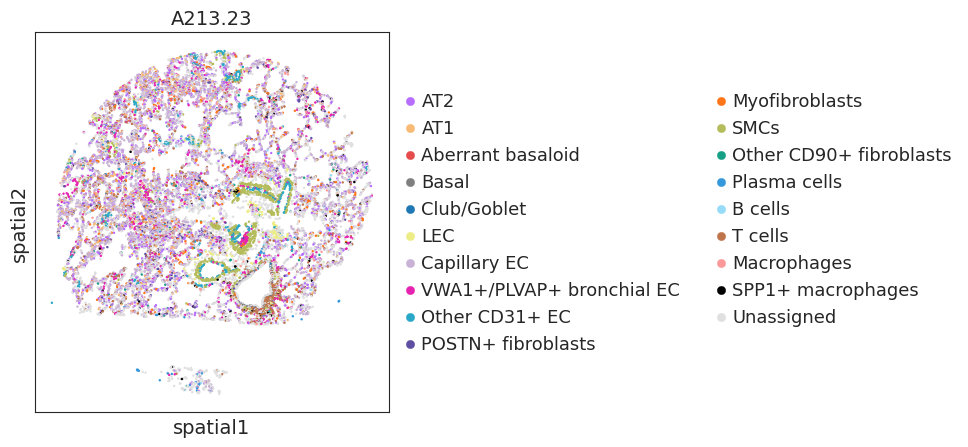

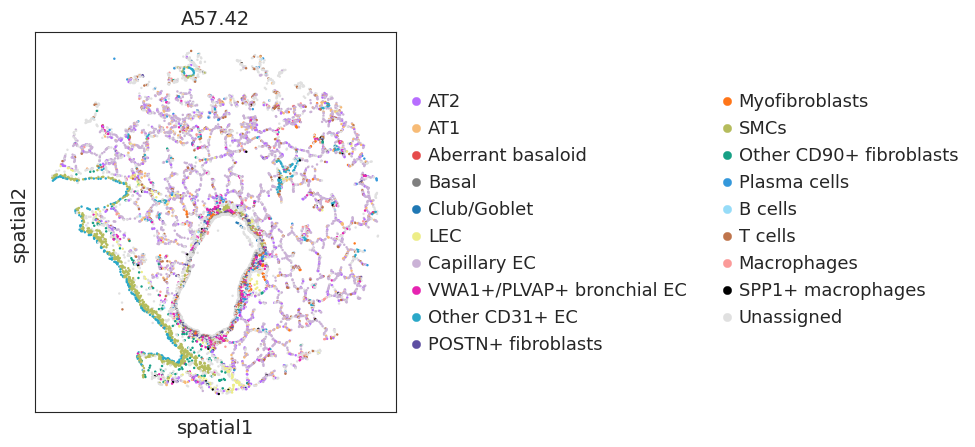

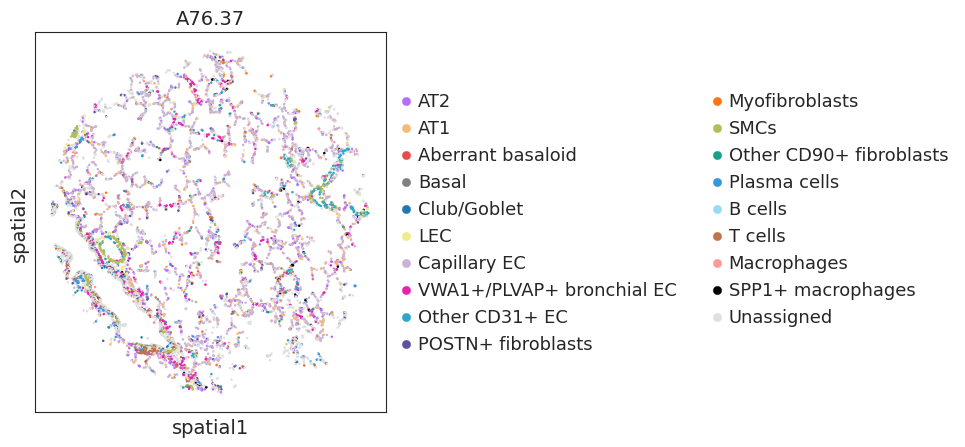

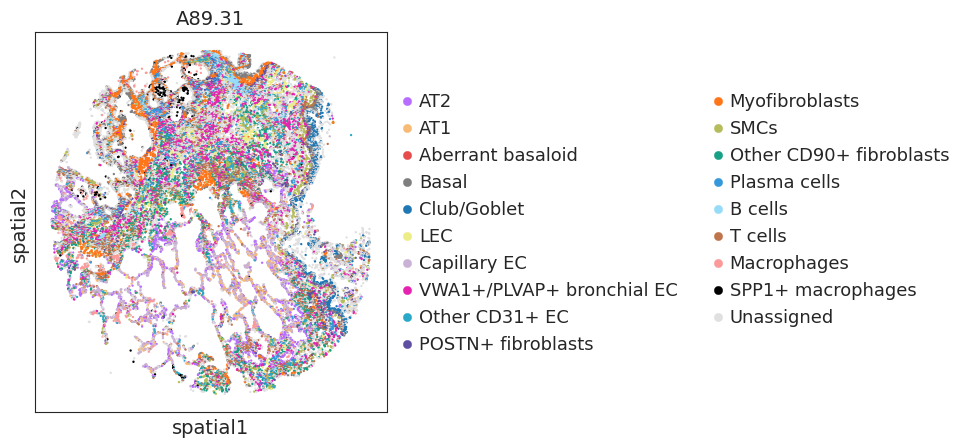

...

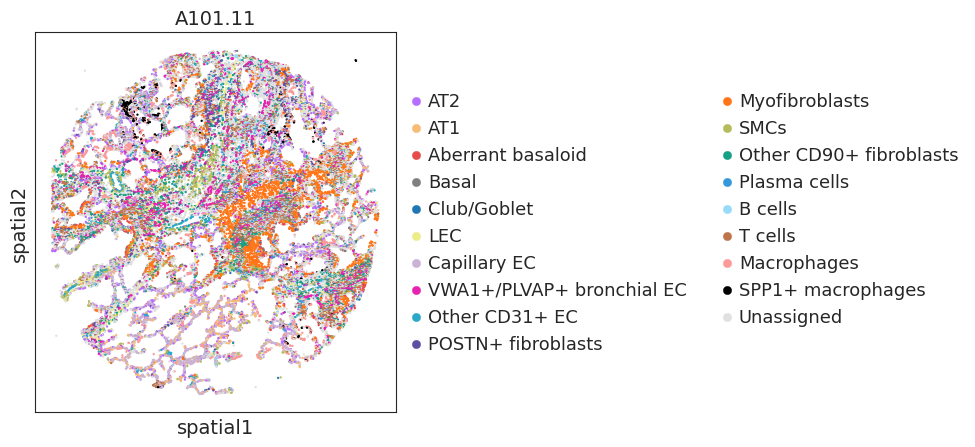

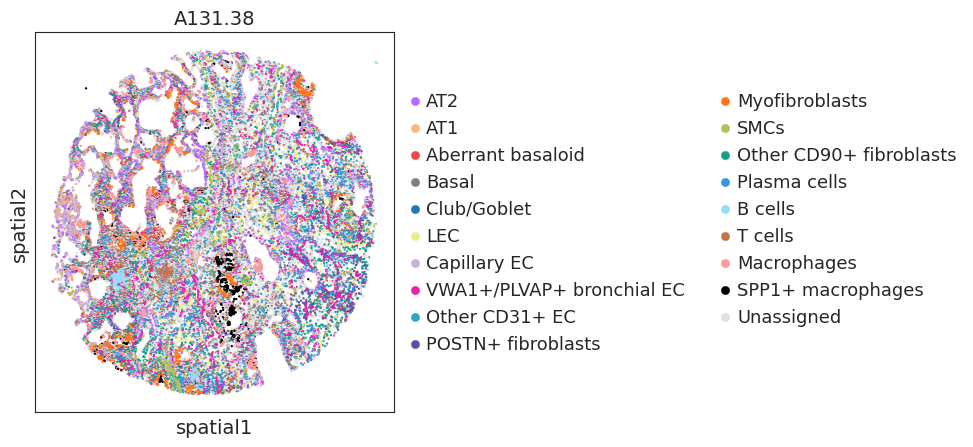

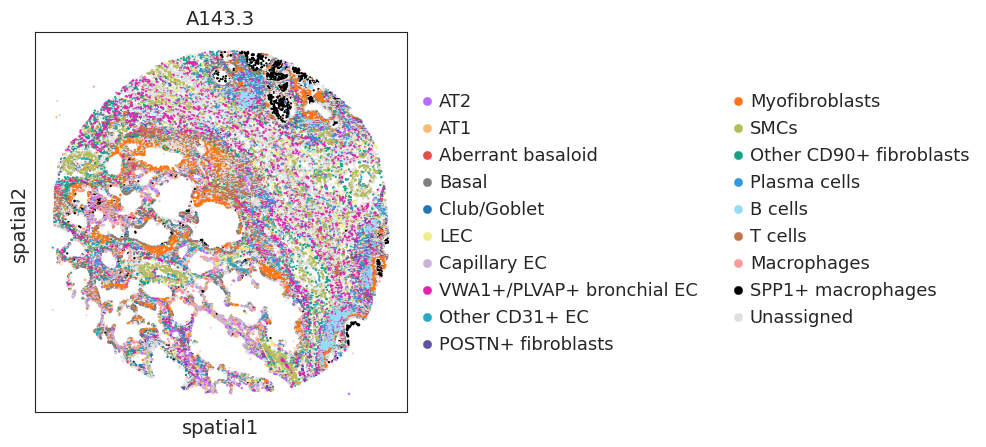

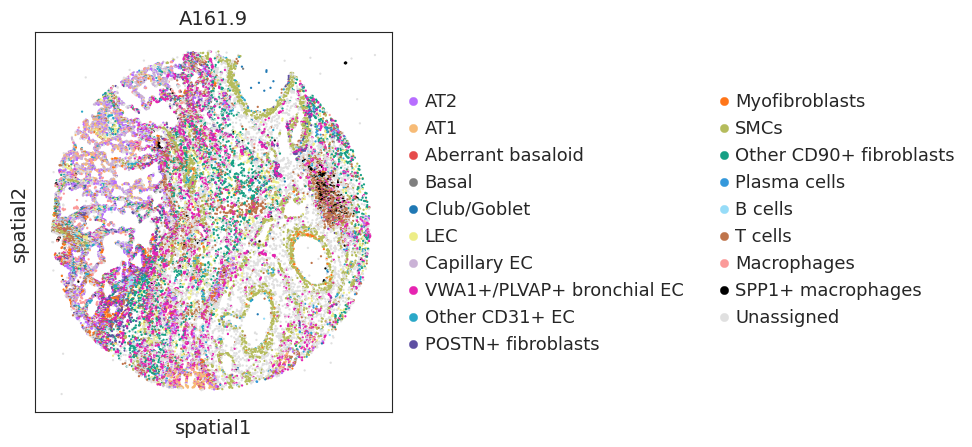

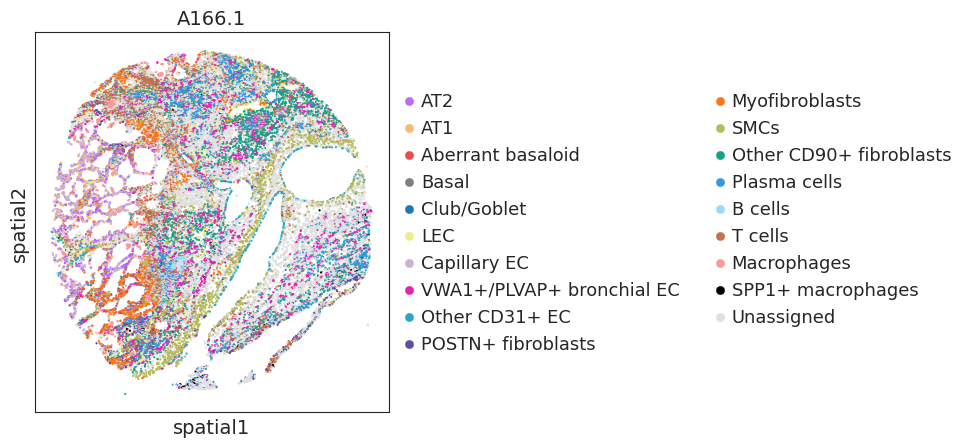

In [11]:
TMAs = ["A159.11", "A213.23", "A57.42", "A76.37", #control
        "A89.31", "A97.50", "A98.78", "A101.11", #mild
        "A131.38", "A143.3", "A161.9", "A166.1", # severe
]
for TMA in TMAs:
    #sc.set_figure_params(figsize=(10, 10))
    sc.pl.spatial(adata[adata.obs.TMA == TMA], color="cell_type", spot_size=30, scale_factor=2.91, cmap = "magma_r", title=TMA)

In [12]:
adata.obs["batch"] = adata.obs["TMA"].copy()

xlabel = "severity"
ct_label = "cell_type"
cols = adata.uns[f"{ct_label}_colors"]
order = adata.obs[xlabel].cat.categories.values
celltypes = adata.obs[ct_label].cat.categories

# sample-level relative frequencies
relFreqs = calc_relFreq(adata, group_by = ct_label , xlabel = xlabel, condition=None) 
relFreqs.head(10)

,AT2,AT1,Aberrant basaloid,Basal,Club/Goblet,LEC,Capillary EC,VWA1+/PLVAP+ bronchial EC,Other CD31+ EC,POSTN+ fibroblasts,Myofibroblasts,SMCs,Other CD90+ fibroblasts,Plasma cells,B cells,T cells,Macrophages,SPP1+ macrophages,Unassigned,severity
A101.11,0.044012,0.022047,0.008802,0.006843,0.002180,0.013300,0.069619,0.076214,0.017881,0.032588,0.075138,0.042936,0.049089,0.025083,0.016142,0.110596,0.037114,0.009741,0.340673,Mild
A131.38,0.059712,0.008388,0.001457,0.002252,0.001567,0.017704,0.044326,0.093221,0.014481,0.031236,0.035628,0.040970,0.047637,0.102757,0.034922,0.102404,0.046555,0.015077,0.299706,Severe
A143.3,0.017667,0.006888,0.002062,0.034205,0.004047,0.015760,0.028057,0.104269,0.017239,0.023017,0.057670,0.071562,0.044848,0.072224,0.049012,0.108744,0.026306,0.019204,0.297222,Severe
A159.11,0.081473,0.037946,0.003754,0.008726,0.006494,0.009233,0.282670,0.032265,0.042208,0.017147,0.017045,0.042512,0.005783,0.018364,0.004363,0.053571,0.013393,0.002435,0.320617,Control
A161.9,0.057356,0.026820,0.000297,0.002765,0.001338,0.022925,0.054383,0.130322,0.018554,0.031399,0.018435,0.088903,0.063154,0.012726,0.011358,0.112452,0.023727,0.011001,0.312084,Severe
A166.1,0.021758,0.013201,0.006053,0.006235,0.000783,0.017923,0.030290,0.079990,0.023532,0.022463,0.036968,0.064440,0.059483,0.079598,0.015732,0.116775,0.018289,0.002922,0.383564,Severe
A213.23,0.090147,0.037215,0.000693,0.004623,0.000636,0.011095,0.247616,0.043802,0.025657,0.018665,0.027911,0.047732,0.004565,0.005894,0.003814,0.064606,0.013233,0.007859,0.344236,Control
A57.42,0.073208,0.040061,0.002368,0.018089,0.001705,0.017899,0.275121,0.031537,0.038356,0.012028,0.012122,0.073208,0.014301,0.014301,0.002557,0.048868,0.008902,0.004072,0.311298,Control
A76.37,0.064099,0.047835,0.002990,0.007654,0.002751,0.009926,0.235829,0.054054,0.032289,0.023439,0.008969,0.045922,0.007295,0.025353,0.003588,0.042334,0.017460,0.006219,0.361995,Control
A89.31,0.034775,0.018944,0.001037,0.039880,0.023639,0.014167,0.060570,0.089778,0.020172,0.025713,0.051126,0.037068,0.052136,0.058496,0.024266,0.103726,0.023393,0.006360,0.314754,Mild


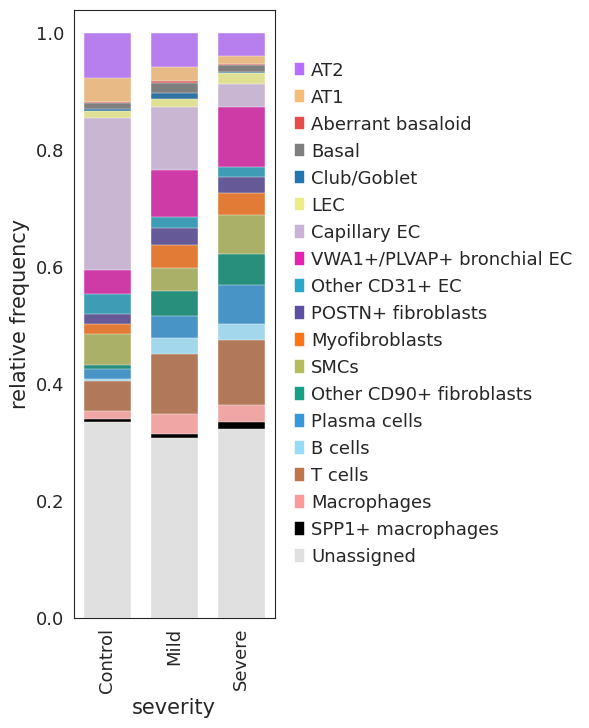

In [13]:
plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (3, 8), cols = cols, 
                               order = ["Control", "Mild", "Severe"],
                               margins = (0.02, 0.04), width = 0.7, )
                               #save = "/media/synology/Huijuan/Plots/IPF_EC paper/TMAs/TMA/"+"ReFreq_IPF_TMA_unknown.pdf")

## Endothelium

In [14]:
endo = adata[adata.obs.Level_1.isin(["Endothelial"])].copy()
endo

AnnData object with n_obs × n_vars = 74914 × 24
    obs: 'TMA', 'condition', 'x', 'y', 'region_num', 'fibrosis_extent', 'leiden_0.3', 'domain', 'severity', 'cell_type', 'Level_1', 'batch', 'fibrosis degree', 'ashcroft score'
    uns: 'Level_1_colors', 'TMA_colors', 'ashcroft score_colors', 'cell_type_colors', 'condition_colors', 'dendrogram_domain', 'dendrogram_leiden_0.3', 'domain_colors', 'fibrosis degree_colors', 'fibrosis_extent_colors', 'leiden_0.3', 'leiden_0.3_colors', 'neighbors', 'pca', 'severity_colors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [15]:
sc.pp.neighbors(endo)
sc.tl.umap(endo)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:29)


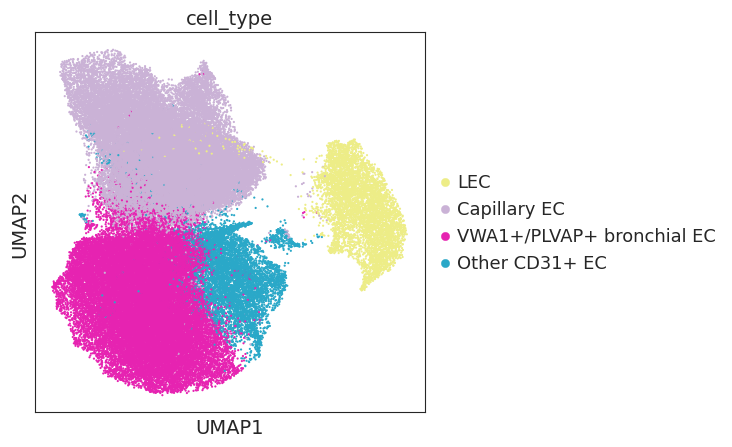

In [16]:
sc.pl.umap(endo, color=["cell_type"], size=10, save= "_endo_celltype_TMA")

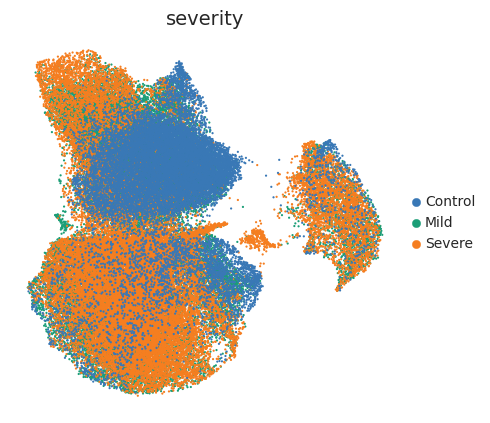

In [17]:
new_color={
    ### Endothelium ###
    'Control':'#3978B6',
    'Mild': '#1B9E77',
    'Severe': '#F57E20', #'#f78b3b'     
}
cell_order = ["Control", "Mild", "Severe"]
label = "severity"
color = [new_color[ct] for ct in cell_order]

endo.uns[f"{label}_colors"] = color
sc.pl.umap(endo, color = ["severity"], size = 10, wspace = 0.2, legend_fontsize=10, legend_fontweight='bold', 
           legend_fontoutline=False, frameon=False,
           add_outline=False, outline_width=(0.05, 0.01))

In [18]:
new_color={
    ### Endothelium ###
    'Capillary EC':'#CAB2D6', 
    'VWA1+/PLVAP+ bronchial EC':'#E623B1', 
    'Other CD31+ EC':'#2AA8C8',
    'LEC':'#e0e093',
}
cell_order = ["Other CD31+ EC", "LEC", "Capillary EC", "VWA1+/PLVAP+ bronchial EC"]
label = "cell_type"
color = [new_color[ct] for ct in cell_order]

endo.obs['cell_type'] = endo.obs['cell_type'].cat.reorder_categories(cell_order)
endo.uns[f"{label}_colors"] = color

In [19]:
endo.obs["batch"] = endo.obs["TMA"].copy()

xlabel = "severity"
ct_label = "cell_type"
cols = endo.uns[f"{ct_label}_colors"]
order = endo.obs[xlabel].cat.categories.values
celltypes = endo.obs[ct_label].cat.categories

# sample-level relative frequencies
relFreqs = calc_relFreq(endo, group_by = ct_label , xlabel = xlabel, condition=None) 
relFreqs.head(10)

,Other CD31+ EC,LEC,Capillary EC,VWA1+/PLVAP+ bronchial EC,severity
A101.11,0.101013,0.075136,0.393297,0.430553,Mild
A131.38,0.085317,0.104305,0.261152,0.549226,Severe
A143.3,0.104272,0.095328,0.169707,0.630693,Severe
A159.11,0.115204,0.025201,0.771531,0.088064,Control
A161.9,0.082030,0.101354,0.240436,0.576180,Severe
A166.1,0.155089,0.118122,0.199622,0.527166,Severe
A213.23,0.078183,0.033809,0.754534,0.133474,Control
A57.42,0.105689,0.049322,0.758090,0.086900,Control
A76.37,0.097227,0.029888,0.710119,0.162766,Control
A89.31,0.109223,0.076707,0.327963,0.486107,Mild


In [20]:
## Export the relative frequency table
#relFreqs.to_csv(plot_folder + "4i_relative_frequencies_severity_EC.csv", index=True)

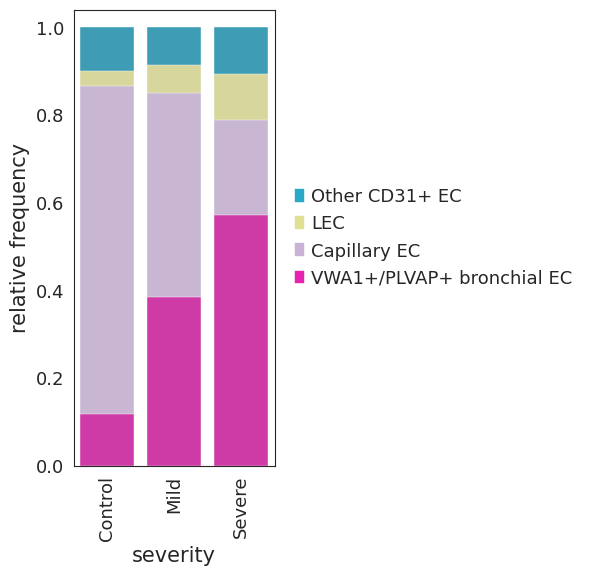

In [21]:
plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (3, 6), cols = cols, 
                               order = ["Control", "Mild", "Severe"],
                               errbar = False, width = 0.8)

## Subset to one TMA

## Control

In [22]:
control = "A57.42"
adata_ctrl = adata[adata.obs["TMA"] == control].copy()

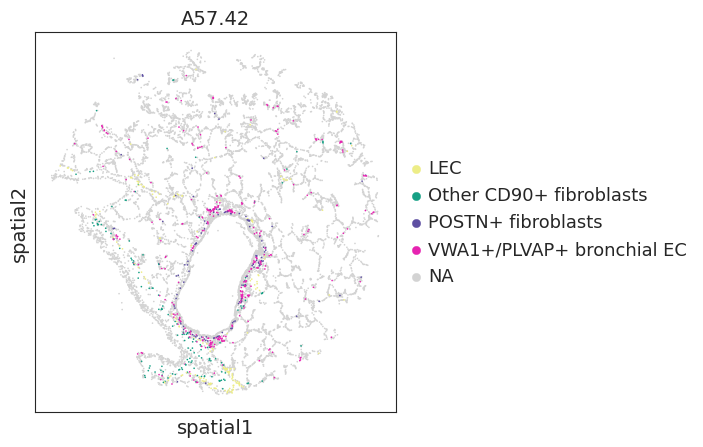

In [23]:
sc.pl.spatial(adata_ctrl, color="cell_type", spot_size=20, 
             groups = ["VWA1+/PLVAP+ bronchial EC", "Other CD90+ fibroblasts", "LEC", "POSTN+ fibroblasts"], cmap = "magma_r", title=control)

In [24]:
coords = adata_ctrl.obsm["spatial"]

x = coords[:, 0]
y = coords[:, 1]

print(x.min(), x.max())
print(y.min(), y.max())

51.53 4051.8
131.96 4343.5


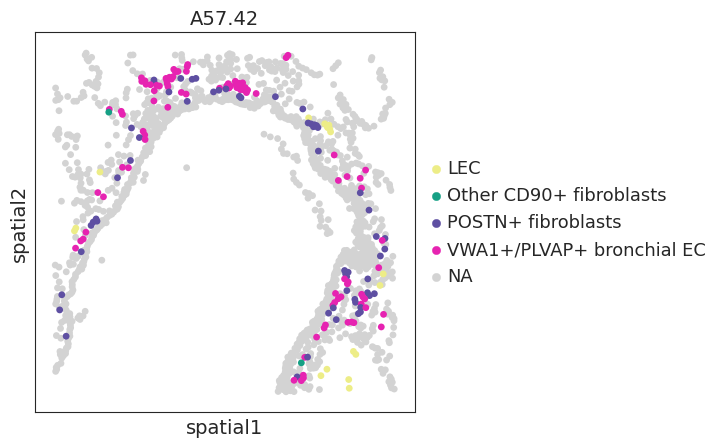

In [25]:
xmin = 1700 
xmax = 2700
ymin = 2000
ymax = 3000

mask = (
    (coords[:, 0] >= xmin) &
    (coords[:, 0] <= xmax) &
    (coords[:, 1] >= ymin) &
    (coords[:, 1] <= ymax)
)

adata_zoom = adata_ctrl[mask].copy()

sc.pl.spatial(
    adata_zoom,
    color="cell_type",
    spot_size=20,
    title = control,
    groups = ["VWA1+/PLVAP+ bronchial EC", "Other CD90+ fibroblasts", "LEC", "POSTN+ fibroblasts"],
    #save= f"{control}_spatial_umap_vascular_niche_zoom.pdf"
)

## Mild

In [26]:
mild = "A98.78"
adata_mild = adata[adata.obs["TMA"] == mild].copy()

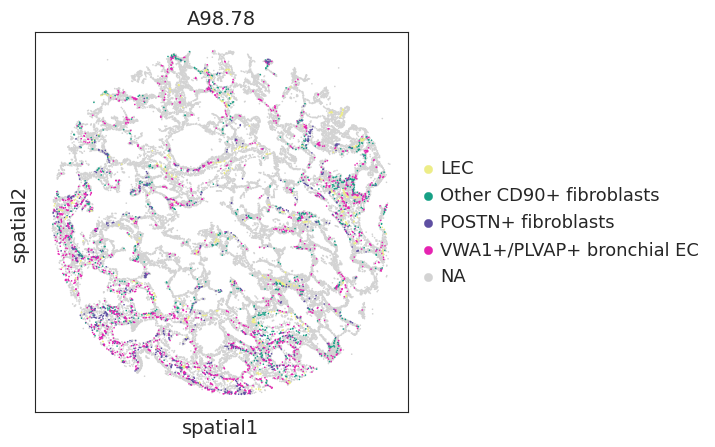

In [27]:
sc.pl.spatial(adata_mild, color="cell_type", spot_size=20, title= mild, cmap = "magma_r",
             groups = ["VWA1+/PLVAP+ bronchial EC", "Other CD90+ fibroblasts", "LEC", "POSTN+ fibroblasts"])

In [28]:
coords = adata_mild.obsm["spatial"]

x = coords[:, 0]
y = coords[:, 1]

print(x.min(), x.max())
print(y.min(), y.max())

52.84 4249.2
69.39 4344.8


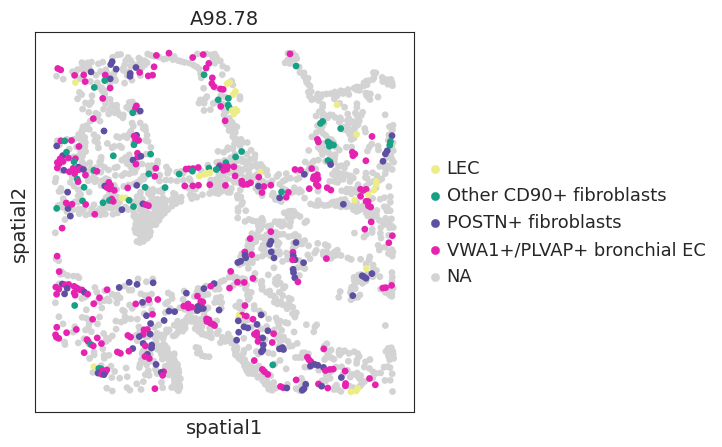

In [29]:
xmin = 800 
xmax = 1800
ymin = 3000
ymax = 4000

mask = (
    (coords[:, 0] >= xmin) &
    (coords[:, 0] <= xmax) &
    (coords[:, 1] >= ymin) &
    (coords[:, 1] <= ymax)
)

adata_zoom = adata_mild[mask].copy()

sc.pl.spatial(
    adata_zoom,
    color="cell_type",
    title = mild,
    spot_size=20,
    groups = ["VWA1+/PLVAP+ bronchial EC", "Other CD90+ fibroblasts", "LEC", "POSTN+ fibroblasts"],
    #save= f"{mild}_spatial_umap_vascular_niche_zoom.pdf"
)

## Severe

In [30]:
severe = "A161.9"
adata_severe = adata[adata.obs["TMA"] == severe].copy()

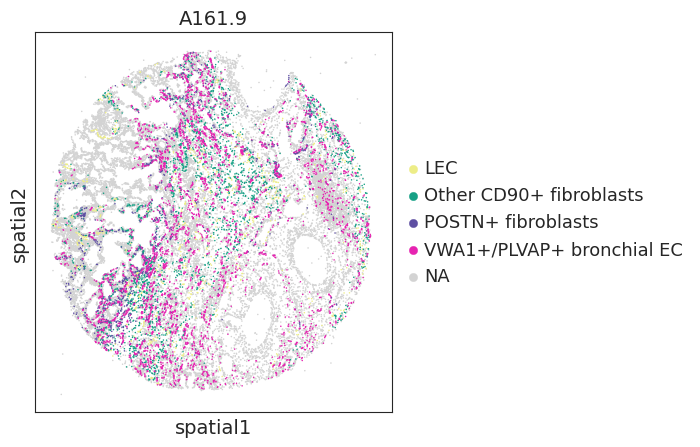

In [31]:
sc.pl.spatial(adata_severe, color="cell_type", spot_size=20, title= severe, cmap = "magma_r",
             groups = ["VWA1+/PLVAP+ bronchial EC", "Other CD90+ fibroblasts", "LEC", "POSTN+ fibroblasts"])

In [32]:
coords = adata_severe.obsm["spatial"]

x = coords[:, 0]
y = coords[:, 1]

print(x.min(), x.max())
print(y.min(), y.max())

8.382 4304.5
42.4 4607.2


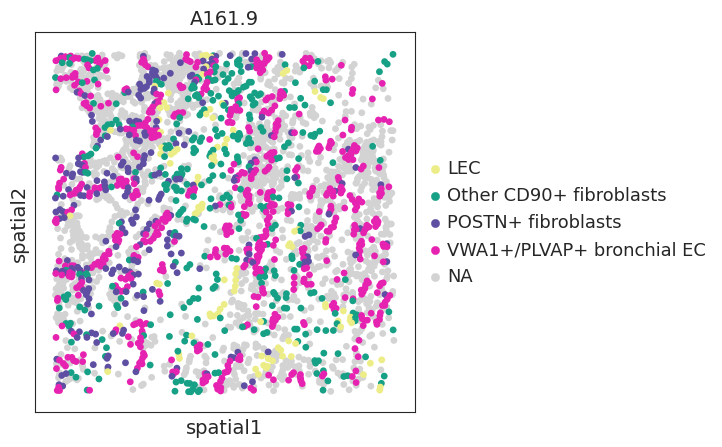

In [33]:
xmin = 700 
xmax = 1700
ymin = 3000
ymax = 4000

mask = (
    (coords[:, 0] >= xmin) &
    (coords[:, 0] <= xmax) &
    (coords[:, 1] >= ymin) &
    (coords[:, 1] <= ymax)
)

adata_zoom = adata_severe[mask].copy()

sc.pl.spatial(
    adata_zoom,
    color="cell_type",
    title = severe,
    spot_size=20,
    groups = ["VWA1+/PLVAP+ bronchial EC", "Other CD90+ fibroblasts", "LEC", "POSTN+ fibroblasts"],
    #save= f"{severe}_spatial_umap_vascular_niche_zoom.pdf"
)

## Remove unknown cells

In [34]:
adata2= adata[-adata.obs.cell_type.isin(["Unassigned"])].copy()
print(adata2.shape)

(238783, 24)


In [35]:
sc.pp.neighbors(adata2)
sc.tl.umap(adata2)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:01:32)


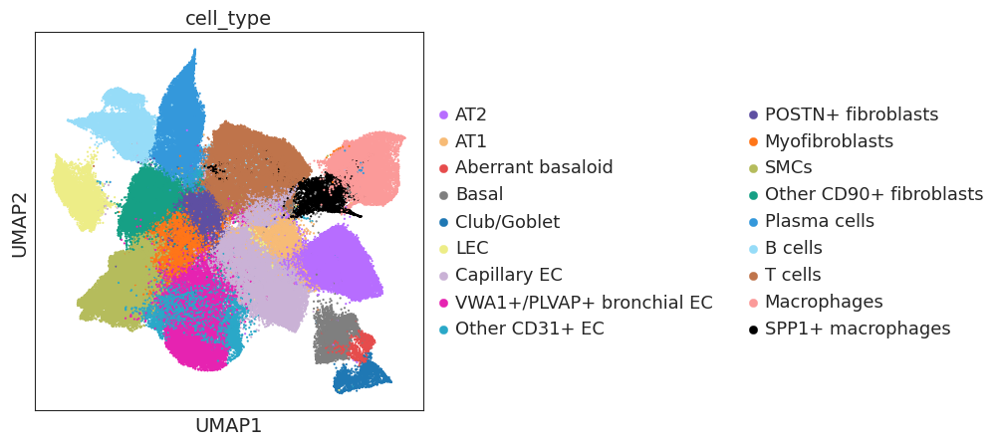

In [36]:
sc.pl.umap(adata2, color = ["cell_type"], wspace = 0.2, size= 10)

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_cell_type']`
categories: AT2, AT1, Aberrant basaloid, etc.
var_group_labels: Epithelial, Endothelial, Stromal, etc.


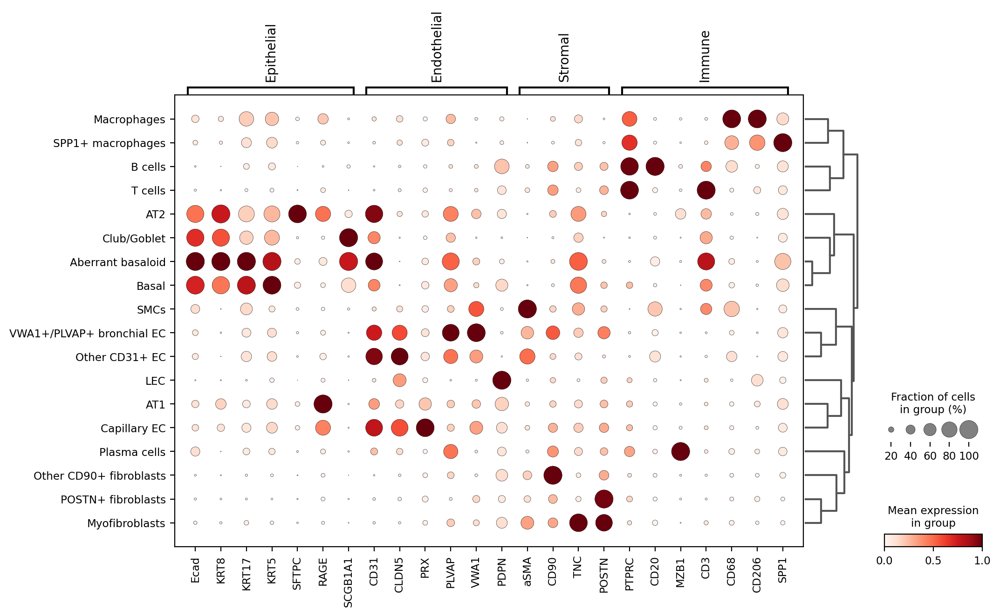

In [37]:
## custom heatmap
celltype_markers={'Epithelial' : ['Ecad', 'KRT8', 'KRT17', 'KRT5', 'SFTPC', 'RAGE', 'SCGB1A1'],
                  'Endothelial' : ['CD31', 'CLDN5', 'PRX', 'PLVAP', 'VWA1', 'PDPN'],
                  'Stromal' : ['aSMA', 'CD90', 'TNC', 'POSTN'],
                  'Immune' : ['PTPRC', 'CD20', 'MZB1', 'CD3', 'CD68', 'CD206', 'SPP1'],
                  }

plt.rcdefaults()
plt.rcParams['pdf.fonttype'] = 42
sc.tl.dendrogram(adata2, groupby="cell_type")
sc.pl.dotplot(adata2, var_names=celltype_markers, groupby = 'cell_type', standard_scale='var', dendrogram=True, cmap="Reds")

In [38]:
xlabel = "severity"
ct_label = "cell_type"
cols = adata2.uns[f"{ct_label}_colors"]
order = adata2.obs[xlabel].cat.categories.values
celltypes = adata2.obs[ct_label].cat.categories

# sample-level relative frequencies
relFreqs = calc_relFreq(adata2, group_by = ct_label , xlabel = xlabel, condition=None) 
relFreqs.head(10)

,AT2,AT1,Aberrant basaloid,Basal,Club/Goblet,LEC,Capillary EC,VWA1+/PLVAP+ bronchial EC,Other CD31+ EC,POSTN+ fibroblasts,Myofibroblasts,SMCs,Other CD90+ fibroblasts,Plasma cells,B cells,T cells,Macrophages,SPP1+ macrophages,severity
A101.11,0.066753,0.033439,0.013351,0.010379,0.003306,0.020172,0.105591,0.115594,0.027120,0.049427,0.113962,0.065121,0.074454,0.038043,0.024483,0.167741,0.056290,0.014774,Mild
A131.38,0.085267,0.011978,0.002080,0.003215,0.002238,0.025281,0.063296,0.133117,0.020678,0.044603,0.050876,0.058505,0.068024,0.146734,0.049868,0.146230,0.066480,0.021529,Severe
A143.3,0.025138,0.009801,0.002935,0.048671,0.005759,0.022425,0.039922,0.148367,0.024529,0.032752,0.082060,0.101827,0.063815,0.102769,0.069740,0.154734,0.037431,0.027326,Severe
A159.11,0.119922,0.055854,0.005526,0.012843,0.009558,0.013590,0.416069,0.047491,0.062127,0.025239,0.025090,0.062575,0.008513,0.027031,0.006422,0.078853,0.019713,0.003584,Control
A161.9,0.083377,0.038987,0.000432,0.004020,0.001945,0.033325,0.079054,0.189445,0.026971,0.045643,0.026798,0.129236,0.091805,0.018499,0.016511,0.163468,0.034492,0.015992,Severe
A166.1,0.035297,0.021415,0.009819,0.010115,0.001270,0.029076,0.049137,0.129761,0.038175,0.036440,0.059971,0.104537,0.096496,0.129126,0.025521,0.189436,0.029668,0.004740,Severe
A213.23,0.137469,0.056750,0.001057,0.007050,0.000969,0.016919,0.377600,0.066796,0.039126,0.028463,0.042563,0.072788,0.006962,0.008988,0.005816,0.098520,0.020180,0.011984,Control
A57.42,0.106298,0.058168,0.003438,0.026265,0.002475,0.025990,0.399477,0.045792,0.055693,0.017464,0.017602,0.106298,0.020765,0.020765,0.003713,0.070957,0.012926,0.005913,Control
A76.37,0.100469,0.074977,0.004686,0.011996,0.004311,0.015558,0.369634,0.084724,0.050609,0.036739,0.014058,0.071978,0.011434,0.039738,0.005623,0.066354,0.027366,0.009747,Control
A89.31,0.050749,0.027645,0.001514,0.058198,0.034496,0.020674,0.088392,0.131015,0.029438,0.037524,0.074610,0.054095,0.076083,0.085365,0.035413,0.151370,0.034138,0.009281,Mild


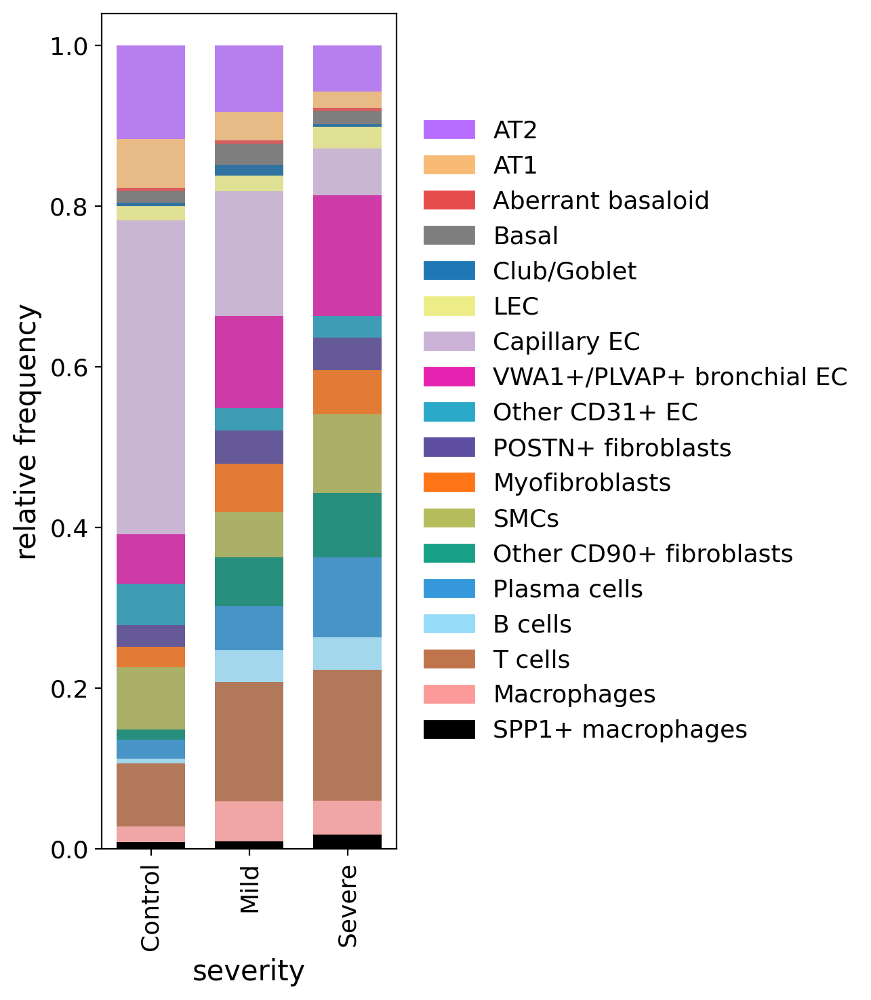

In [39]:
plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (3, 8), cols = cols, 
                               order= ["Control", "Mild", "Severe"],
                               margins = (0.02, 0.04), width = 0.7,)
                               #save = "/media/synology/Huijuan/Plots/IPF_EC paper/TMAs/TMA/"+"ReFreq_IPF_TMA.pdf")

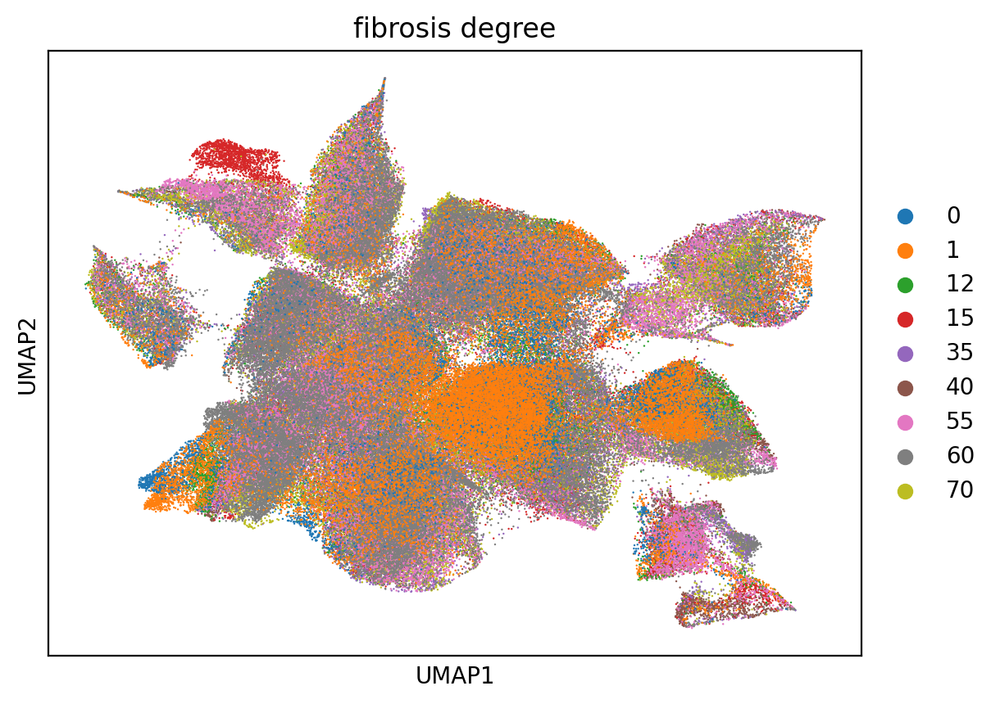

In [40]:
sc.pl.umap(adata2, color = ["fibrosis degree"], size = 3)

In [41]:
xlabel = "fibrosis degree"
ct_label = "cell_type"
cols = adata2.uns[f"{ct_label}_colors"]
order = adata2.obs[xlabel].cat.categories.values
celltypes = adata2.obs[ct_label].cat.categories

# sample-level relative frequencies
relFreqs = calc_relFreq(adata2, group_by = ct_label , xlabel = xlabel, condition=None) 
relFreqs.head(10)

,AT2,AT1,Aberrant basaloid,Basal,Club/Goblet,LEC,Capillary EC,VWA1+/PLVAP+ bronchial EC,Other CD31+ EC,POSTN+ fibroblasts,Myofibroblasts,SMCs,Other CD90+ fibroblasts,Plasma cells,B cells,T cells,Macrophages,SPP1+ macrophages,fibrosis degree
A101.11,0.066753,0.033439,0.013351,0.010379,0.003306,0.020172,0.105591,0.115594,0.027120,0.049427,0.113962,0.065121,0.074454,0.038043,0.024483,0.167741,0.056290,0.014774,35
A131.38,0.085267,0.011978,0.002080,0.003215,0.002238,0.025281,0.063296,0.133117,0.020678,0.044603,0.050876,0.058505,0.068024,0.146734,0.049868,0.146230,0.066480,0.021529,70
A143.3,0.025138,0.009801,0.002935,0.048671,0.005759,0.022425,0.039922,0.148367,0.024529,0.032752,0.082060,0.101827,0.063815,0.102769,0.069740,0.154734,0.037431,0.027326,55
A159.11,0.119922,0.055854,0.005526,0.012843,0.009558,0.013590,0.416069,0.047491,0.062127,0.025239,0.025090,0.062575,0.008513,0.027031,0.006422,0.078853,0.019713,0.003584,1
A161.9,0.083377,0.038987,0.000432,0.004020,0.001945,0.033325,0.079054,0.189445,0.026971,0.045643,0.026798,0.129236,0.091805,0.018499,0.016511,0.163468,0.034492,0.015992,60
A166.1,0.035297,0.021415,0.009819,0.010115,0.001270,0.029076,0.049137,0.129761,0.038175,0.036440,0.059971,0.104537,0.096496,0.129126,0.025521,0.189436,0.029668,0.004740,60
A213.23,0.137469,0.056750,0.001057,0.007050,0.000969,0.016919,0.377600,0.066796,0.039126,0.028463,0.042563,0.072788,0.006962,0.008988,0.005816,0.098520,0.020180,0.011984,1
A57.42,0.106298,0.058168,0.003438,0.026265,0.002475,0.025990,0.399477,0.045792,0.055693,0.017464,0.017602,0.106298,0.020765,0.020765,0.003713,0.070957,0.012926,0.005913,0
A76.37,0.100469,0.074977,0.004686,0.011996,0.004311,0.015558,0.369634,0.084724,0.050609,0.036739,0.014058,0.071978,0.011434,0.039738,0.005623,0.066354,0.027366,0.009747,1
A89.31,0.050749,0.027645,0.001514,0.058198,0.034496,0.020674,0.088392,0.131015,0.029438,0.037524,0.074610,0.054095,0.076083,0.085365,0.035413,0.151370,0.034138,0.009281,40


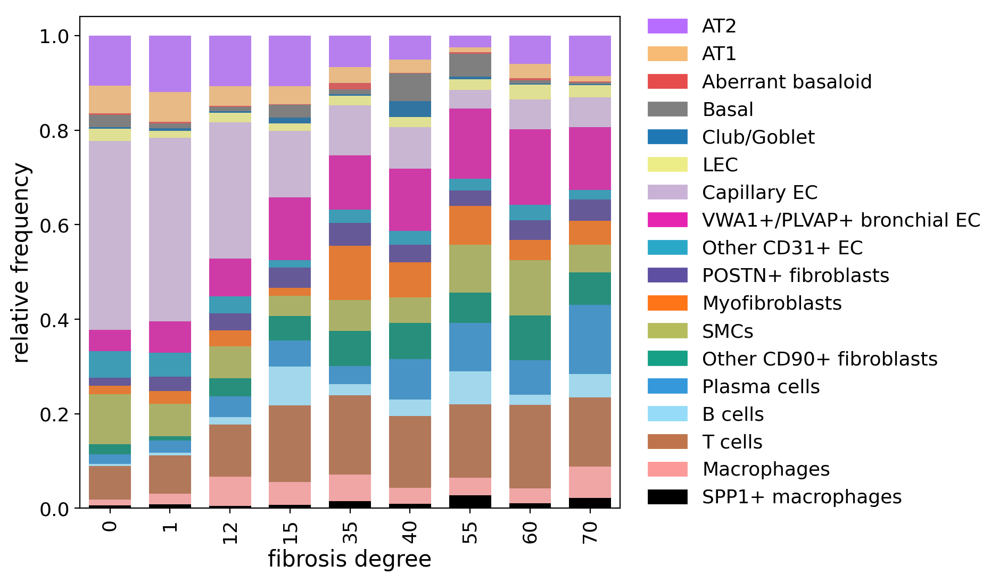

In [42]:
plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (7, 6), cols = cols, 
                               margins = (0.02, 0.04), order=order, width = 0.7)

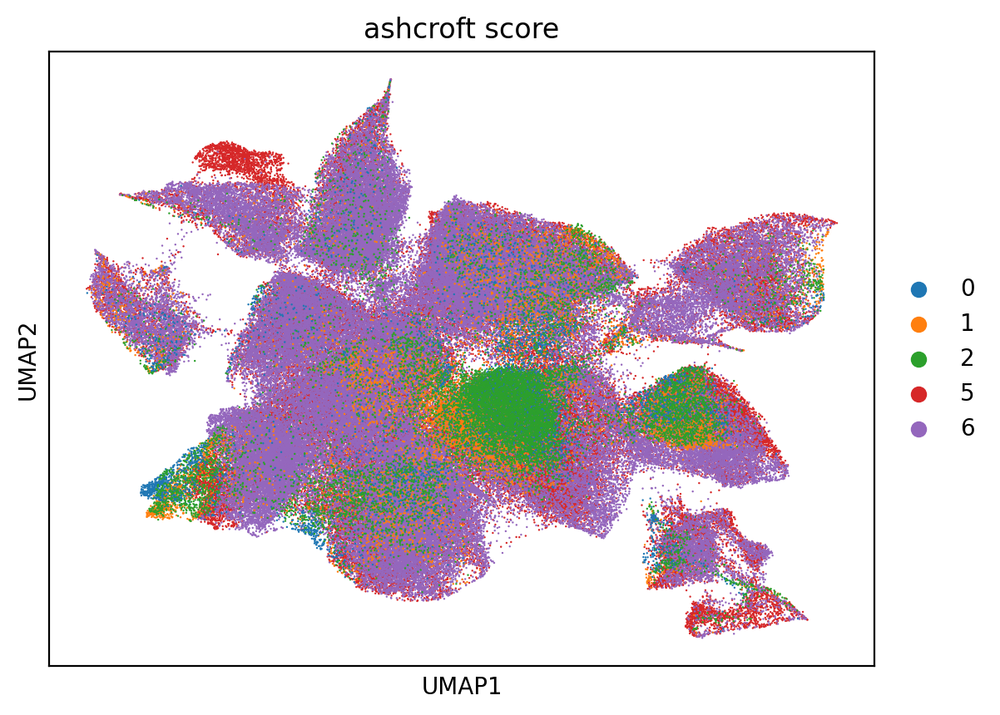

In [43]:
sc.pl.umap(adata2, color = ["ashcroft score"], size = 3)

In [44]:
xlabel = "ashcroft score"
ct_label = "cell_type"
cols = adata2.uns[f"{ct_label}_colors"]
order = adata2.obs[xlabel].cat.categories.values
celltypes = adata2.obs[ct_label].cat.categories

# sample-level relative frequencies
relFreqs = calc_relFreq(adata2, group_by = ct_label , xlabel = xlabel, condition=None) 
relFreqs.head(10)

,AT2,AT1,Aberrant basaloid,Basal,Club/Goblet,LEC,Capillary EC,VWA1+/PLVAP+ bronchial EC,Other CD31+ EC,POSTN+ fibroblasts,Myofibroblasts,SMCs,Other CD90+ fibroblasts,Plasma cells,B cells,T cells,Macrophages,SPP1+ macrophages,ashcroft score
A101.11,0.066753,0.033439,0.013351,0.010379,0.003306,0.020172,0.105591,0.115594,0.027120,0.049427,0.113962,0.065121,0.074454,0.038043,0.024483,0.167741,0.056290,0.014774,5
A131.38,0.085267,0.011978,0.002080,0.003215,0.002238,0.025281,0.063296,0.133117,0.020678,0.044603,0.050876,0.058505,0.068024,0.146734,0.049868,0.146230,0.066480,0.021529,6
A143.3,0.025138,0.009801,0.002935,0.048671,0.005759,0.022425,0.039922,0.148367,0.024529,0.032752,0.082060,0.101827,0.063815,0.102769,0.069740,0.154734,0.037431,0.027326,6
A159.11,0.119922,0.055854,0.005526,0.012843,0.009558,0.013590,0.416069,0.047491,0.062127,0.025239,0.025090,0.062575,0.008513,0.027031,0.006422,0.078853,0.019713,0.003584,2
A161.9,0.083377,0.038987,0.000432,0.004020,0.001945,0.033325,0.079054,0.189445,0.026971,0.045643,0.026798,0.129236,0.091805,0.018499,0.016511,0.163468,0.034492,0.015992,6
A166.1,0.035297,0.021415,0.009819,0.010115,0.001270,0.029076,0.049137,0.129761,0.038175,0.036440,0.059971,0.104537,0.096496,0.129126,0.025521,0.189436,0.029668,0.004740,6
A213.23,0.137469,0.056750,0.001057,0.007050,0.000969,0.016919,0.377600,0.066796,0.039126,0.028463,0.042563,0.072788,0.006962,0.008988,0.005816,0.098520,0.020180,0.011984,1
A57.42,0.106298,0.058168,0.003438,0.026265,0.002475,0.025990,0.399477,0.045792,0.055693,0.017464,0.017602,0.106298,0.020765,0.020765,0.003713,0.070957,0.012926,0.005913,0
A76.37,0.100469,0.074977,0.004686,0.011996,0.004311,0.015558,0.369634,0.084724,0.050609,0.036739,0.014058,0.071978,0.011434,0.039738,0.005623,0.066354,0.027366,0.009747,2
A89.31,0.050749,0.027645,0.001514,0.058198,0.034496,0.020674,0.088392,0.131015,0.029438,0.037524,0.074610,0.054095,0.076083,0.085365,0.035413,0.151370,0.034138,0.009281,5


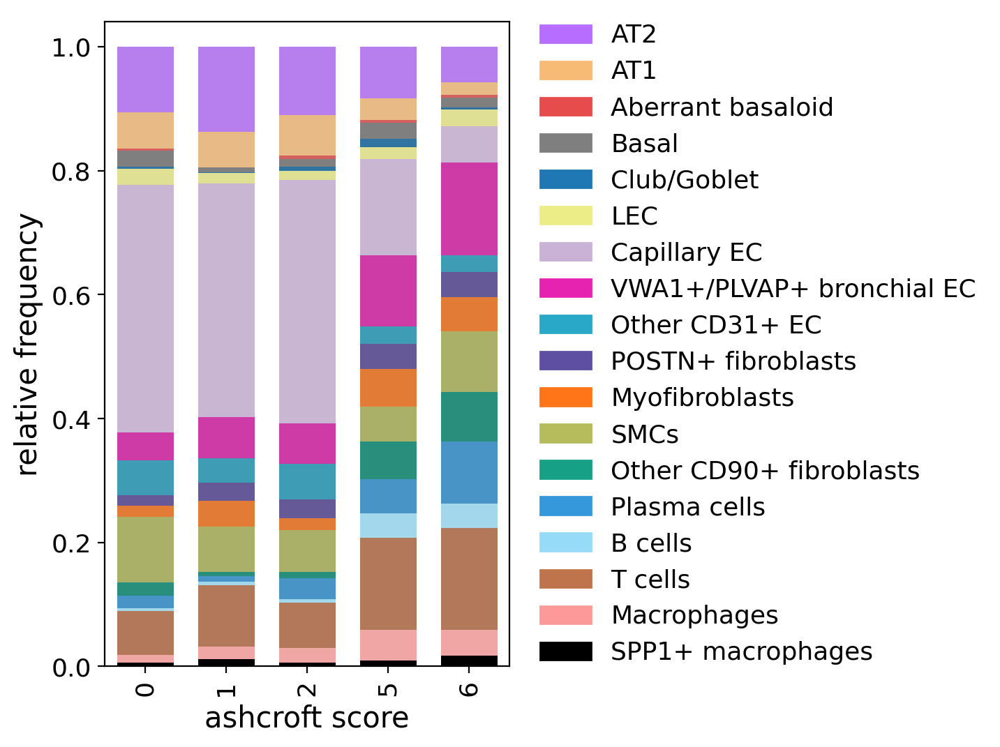

In [45]:
plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (4, 6), cols = cols, 
                               margins = (0.02, 0.04), order=order, width = 0.7)

## Correlation plot

In [46]:
adata2.obs["batch"] = adata2.obs["TMA"].copy()

xlabel = "TMA"
ct_label = "cell_type"
cols = adata2.uns[f"{ct_label}_colors"]
order = adata2.obs[xlabel].cat.categories.values
celltypes = adata2.obs[ct_label].cat.categories

# sample-level relative frequencies
relFreqs = calc_relFreq(adata2, group_by = ct_label , xlabel = xlabel, condition=None) 
relFreqs.head(10)

,AT2,AT1,Aberrant basaloid,Basal,Club/Goblet,LEC,Capillary EC,VWA1+/PLVAP+ bronchial EC,Other CD31+ EC,POSTN+ fibroblasts,Myofibroblasts,SMCs,Other CD90+ fibroblasts,Plasma cells,B cells,T cells,Macrophages,SPP1+ macrophages,TMA
A101.11,0.066753,0.033439,0.013351,0.010379,0.003306,0.020172,0.105591,0.115594,0.027120,0.049427,0.113962,0.065121,0.074454,0.038043,0.024483,0.167741,0.056290,0.014774,A101.11
A131.38,0.085267,0.011978,0.002080,0.003215,0.002238,0.025281,0.063296,0.133117,0.020678,0.044603,0.050876,0.058505,0.068024,0.146734,0.049868,0.146230,0.066480,0.021529,A131.38
A143.3,0.025138,0.009801,0.002935,0.048671,0.005759,0.022425,0.039922,0.148367,0.024529,0.032752,0.082060,0.101827,0.063815,0.102769,0.069740,0.154734,0.037431,0.027326,A143.3
A159.11,0.119922,0.055854,0.005526,0.012843,0.009558,0.013590,0.416069,0.047491,0.062127,0.025239,0.025090,0.062575,0.008513,0.027031,0.006422,0.078853,0.019713,0.003584,A159.11
A161.9,0.083377,0.038987,0.000432,0.004020,0.001945,0.033325,0.079054,0.189445,0.026971,0.045643,0.026798,0.129236,0.091805,0.018499,0.016511,0.163468,0.034492,0.015992,A161.9
A166.1,0.035297,0.021415,0.009819,0.010115,0.001270,0.029076,0.049137,0.129761,0.038175,0.036440,0.059971,0.104537,0.096496,0.129126,0.025521,0.189436,0.029668,0.004740,A166.1
A213.23,0.137469,0.056750,0.001057,0.007050,0.000969,0.016919,0.377600,0.066796,0.039126,0.028463,0.042563,0.072788,0.006962,0.008988,0.005816,0.098520,0.020180,0.011984,A213.23
A57.42,0.106298,0.058168,0.003438,0.026265,0.002475,0.025990,0.399477,0.045792,0.055693,0.017464,0.017602,0.106298,0.020765,0.020765,0.003713,0.070957,0.012926,0.005913,A57.42
A76.37,0.100469,0.074977,0.004686,0.011996,0.004311,0.015558,0.369634,0.084724,0.050609,0.036739,0.014058,0.071978,0.011434,0.039738,0.005623,0.066354,0.027366,0.009747,A76.37
A89.31,0.050749,0.027645,0.001514,0.058198,0.034496,0.020674,0.088392,0.131015,0.029438,0.037524,0.074610,0.054095,0.076083,0.085365,0.035413,0.151370,0.034138,0.009281,A89.31


In [47]:
adata2.obs.head()

,TMA,condition,x,y,region_num,fibrosis_extent,leiden_0.3,domain,severity,cell_type,Level_1,batch,fibrosis degree,ashcroft score
12,A89.31,IPF,713.99,523.01,2,MF,1,Epithelial,Mild,Basal,Epithelial,A89.31,40,5
19,A89.31,IPF,735.99,547.85,2,MF,0,Stromal,Mild,Myofibroblasts,Stromal,A89.31,40,5
31,A89.31,IPF,739.71,559.92,2,MF,0,Stromal,Mild,POSTN+ fibroblasts,Stromal,A89.31,40,5
32,A89.31,IPF,726.68,563.06,2,MF,1,Epithelial,Mild,Basal,Epithelial,A89.31,40,5
33,A89.31,IPF,762.73,563.89,2,MF,0,Stromal,Mild,Myofibroblasts,Stromal,A89.31,40,5


In [48]:
# Create core-level metadata2
SCORE_COLS = ["ashcroft score", "fibrosis degree"]

meta_indexed = (
    adata2.obs
    .groupby("TMA")[SCORE_COLS]
    .first()
    .apply(pd.to_numeric, errors="coerce")
)
print(meta_indexed.head(3))

         ashcroft score  fibrosis degree
TMA                                     
A101.11               5               35
A131.38               6               70
A143.3                6               55


In [49]:
# Keep only genuine cell-type columns
ct_cols = [c for c in relFreqs.columns if c in list(celltypes)]
ct_cols

['AT2',
 'AT1',
 'Aberrant basaloid',
 'Basal',
 'Club/Goblet',
 'LEC',
 'Capillary EC',
 'VWA1+/PLVAP+ bronchial EC',
 'Other CD31+ EC',
 'POSTN+ fibroblasts',
 'Myofibroblasts',
 'SMCs',
 'Other CD90+ fibroblasts',
 'Plasma cells',
 'B cells',
 'T cells',
 'Macrophages',
 'SPP1+ macrophages']

In [50]:
scores_aligned = meta_indexed.reindex(relFreqs.index)   # (n_cores × n_scores)
 
shared_cores = scores_aligned.dropna(how="all").index
print(f"  Cores with ≥1 valid score : {len(shared_cores)}")
 
relFreqs_sub = relFreqs.loc[shared_cores, ct_cols]
scores_sub   = scores_aligned.loc[shared_cores]

  Cores with ≥1 valid score : 12


In [51]:
from scipy.stats import spearmanr
from statsmodels.stats.multitest import multipletests

n_scores = len(SCORE_COLS)
n_cts    = len(ct_cols)
 
rho_mat  = np.zeros((n_scores, n_cts))
pval_mat = np.ones( (n_scores, n_cts))
 
for i, score_col in enumerate(SCORE_COLS):
    score_vals = scores_sub[score_col].values
    valid      = ~np.isnan(score_vals)
 
    raw_pvals = np.ones(n_cts)
    for j, ct in enumerate(ct_cols):
        x = relFreqs_sub[ct].values[valid]
        y = score_vals[valid]
        if x.std() == 0 or len(x) < 5:
            continue
        rho, p        = spearmanr(x, y)
        rho_mat[i, j] = rho
        raw_pvals[j]  = p
     #Benjamini-Hochberg correction controls false discoveries
    _, padj, _, _ = multipletests(raw_pvals, method="fdr_bh")
    pval_mat[i]   = padj
 
padj_mat = pval_mat
 
 
def sig_label(p):
    if p < 0.001: return "***"
    if p < 0.01:  return "**"
    if p < 0.05:  return "*"
    return ""

In [52]:
RANK_BY_IDX = 1   # 0 = rank by ashcroft score, 1 = rank by fibrosis extent 
col_order    = np.argsort(rho_mat[RANK_BY_IDX])[::-1]
 
ct_ordered   = [ct_cols[i] for i in col_order]
rho_ordered  = rho_mat[:, col_order]
padj_ordered = padj_mat[:, col_order]
 
n_rows = n_scores
n_cols = n_cts

Saved → /media/synology/Huijuan/Plots/IPF_EC paper/TMAs/TMA/4i_correlation_heatmap.pdf


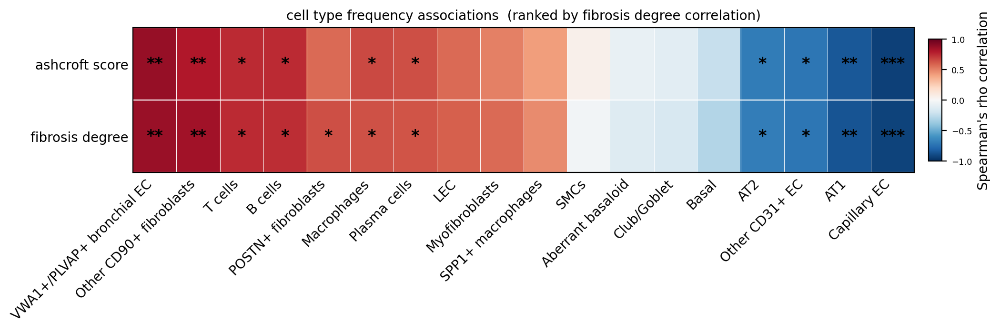

In [53]:
import matplotlib.colors as mcolors
fig_w = max(10, n_cols * 0.36)
fig_h = 4.0
 
fig = plt.figure(figsize=(fig_w, fig_h))
 
left_margin  = 0.10   # space for y-axis labels
right_margin = 0.92   # right edge of heatmap / dendrogram
cbar_left    = 0.935
heat_bottom  = 0.22
heat_height  = 0.38
 
ax_heat = fig.add_axes([left_margin, heat_bottom, right_margin - left_margin, heat_height])
ax_cbar = fig.add_axes([cbar_left,   heat_bottom + 0.03, 0.014, heat_height - 0.06])

# Title
rank_label = SCORE_COLS[RANK_BY_IDX]
ax_heat.set_title(
    f"cell type frequency associations  (ranked by {rank_label} correlation)",
    fontsize=10, pad=6
)

# Heatmap 
cmap = plt.cm.RdBu_r
norm = mcolors.Normalize(-1, 1)
 
ax_heat.imshow(rho_ordered, aspect="auto", cmap=cmap, norm=norm,
               interpolation="nearest")
 
# Significance annotations
for i in range(n_rows):
    for j in range(n_cols):
        lbl = sig_label(padj_ordered[i, j])
        if lbl:
            ax_heat.text(j, i, lbl, ha="center", va="center",
                         fontsize=12, color="black", fontweight="bold")
 
# X-axis: angled labels (45°)
ax_heat.set_xticks(np.arange(n_cols))
ax_heat.set_xticklabels(ct_ordered, rotation=45, fontsize=10, ha="right")
 
# Y-axis: score names on the left
ax_heat.set_yticks(np.arange(n_rows))
ax_heat.set_yticklabels(SCORE_COLS, fontsize=10)
ax_heat.yaxis.set_tick_params(length=0)
ax_heat.xaxis.set_tick_params(length=0)
 
# Thin white grid between tiles
for x in np.arange(-0.5, n_cols, 1):
    ax_heat.axvline(x, color="white", lw=0.35)
for y in np.arange(-0.5, n_rows, 1):
    ax_heat.axhline(y, color="white", lw=0.8)
 
 
# Colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cb = plt.colorbar(sm, cax=ax_cbar)
cb.set_label("Spearman's rho correlation", fontsize=10, rotation=90, labelpad=4)
cb.set_ticks([-1.0, -0.5, 0.0, 0.5, 1.0])
cb.ax.tick_params(labelsize=6.5)

# Save
out_path = plot_folder + '4i_correlation_heatmap.pdf'
#plt.savefig(out_path, bbox_inches="tight")
print(f"Saved → {out_path}")